In [4]:
import numpy as np
import pandas as pd

In [5]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

from mpl_toolkits.basemap import Basemap
#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("whitegrid")
sns.set_context("paper")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

set1 = {'red': '#e41a1c', 'blue': '#377eb8', 'green': '#4daf4a',
        'purple': '#984ea3', 'orange': '#ff7f00', 
        'yellow': '#ffff33', 'brown': '#a65628'}

solarized = dict(yellow='#b58900', orange='#cb4b16', red='#dc322f', 
                 magenta='#d33682', violet='#6c71c4', blue='#268bd2',
                 cyan='#2aa198', green='#859900')

def get_hex_colors(col_map_name, nr_colors):
    hexcolors = list()
    cmap = plt.cm.get_cmap(col_map_name, nr_colors)
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        hexcolors.append(matplotlib.colors.rgb2hex(rgb))
    return hexcolors

hex_colors = get_hex_colors('Paired', 12)

blue_pair = hex_colors[0:2]
green_pair = hex_colors[2:4]
red_pair = hex_colors[4:6]
orange_pair = hex_colors[6:8]
purple_pair = hex_colors[8:10]
brown_pair = hex_colors[10:12]

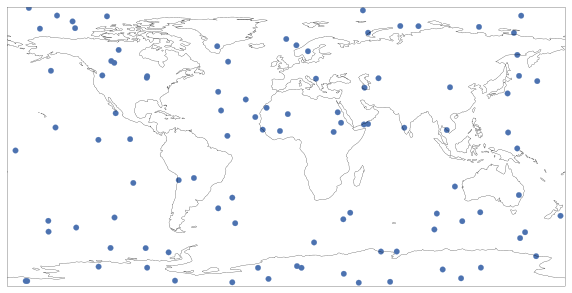

In [6]:
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

np.random.seed(1)
lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90

ax.scatter(lon, lat, transform=ccrs.Geodetic())

ax.coastlines()

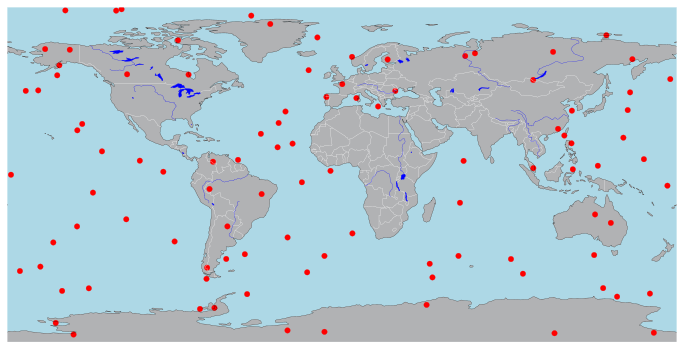

In [7]:
plt.close()

projection = ccrs.PlateCarree()
#projection = ccrs.Mollweide()
#projection = ccrs.Robinson()

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=.001, facecolor='#B1B2B4')
ax.add_feature(cartopy.feature.OCEAN, facecolor='lightblue')
ax.add_feature(cartopy.feature.BORDERS, edgecolor='white', linewidth=.25)
ax.add_feature(cartopy.feature.RIVERS, edgecolor='blue', linewidth=.25)
ax.add_feature(cartopy.feature.LAKES, facecolor='blue', linewidth=.25)

#ax.stock_img()
ax.coastlines(color='black')
ax.set_global()
ax.outline_patch.set_edgecolor('white')


lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90
ax.scatter(lon, lat, color='red', transform=ccrs.Geodetic())

plt.savefig('tmp.png', bbox_inches='tight', pad_inches=.2, dpi=300)


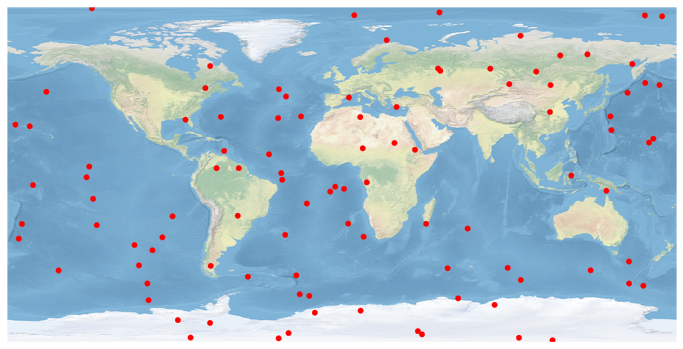

In [8]:

projection = ccrs.PlateCarree()
#projection = ccrs.Mollweide()
#projection = ccrs.Robinson()

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection=projection)

ax.stock_img()
ax.set_global()
ax.outline_patch.set_edgecolor('white')


lon = 360 * np.random.rand(100)
lat = 180 * np.random.rand(100) - 90
ax.scatter(lon, lat, color='red', transform=ccrs.Geodetic())

plt.savefig('tmp.png', bbox_inches='tight', pad_inches=.2, dpi=300)


### Backtracking Algorithm

The idea is to assign colors one by one to different vertices, starting from the vertex 0. Before assigning a color, we check for safety by considering already assigned colors to the adjacent vertices. If we find a color assignment which is safe, we mark the color assignment as part of solution. If we do not a find color due to clashes then we backtrack and return false.

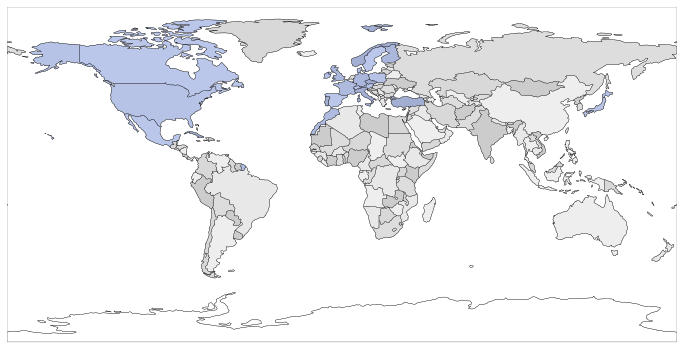

In [21]:
import pandas as pd
import random 
random.seed(2)


# neigboring countries
# https://en.wikipedia.org/wiki/List_of_political_and_geographic_borders
countries_df = pd.read_table('countries.csv', sep=';').fillna('')

neighbors = dict()
for tup in countries_df.itertuples():
    lst = tup.Neighbors.split(' / ')
    if lst == ['']:
        lst = []
    neighbors[tup.Country] = lst

nr_countries = len(neighbors)
countries = sorted(neighbors)


# graph matrix of neighbors
graph = pd.DataFrame(dict((x, [0]*nr_countries) for x in countries), index=countries)
for c, n in neighbors.items():
    l = [x for x in n if x in countries]
    graph.loc[l, c] = 1
    
    
# map figure
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
#resolution='10m' 
#resolution='50m'
resolution='110m'
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection=projection)


# country shape info
shpfilename = shpreader.natural_earth(resolution=resolution,
                                      category='cultural',
                                      name='admin_0_countries')
reader = shpreader.Reader(shpfilename)
records = reader.records()
info = dict((r.attributes['NAME_LONG'], r) for r in records)

# five map colors
#colors = ['pink', 'lightgreen', 'lightblue', 'orange', 'yellow']
colors = ['#EEEEEE', '#E8E8E8', '#DDDDDD', '#D8D8D8', '#CCCCCC']

# get order in which countries should be colored
stack = list()
while len(graph):
    assert graph.sum().min() < 5
    country = graph.sum().idxmin()
    stack.append(country)
    graph.drop(country, axis=0, inplace=True)
    graph.drop(country, axis=1, inplace=True)

def get_color(name, already_colored):
    lst = list()
    for n in neighbors[name]:
        if n in already_colored:
            lst.append(already_colored[n])    
    return random.choice([x for x in colors if x not in lst])

# color countries popped off stack
country_colors = dict()
for name in reversed(stack):
    country_colors[name] = get_color(name, country_colors)
    
    
# for name, neighb in neighbors.items():
#     if country_colors[name] in [country_colors[n] for n in neighb if n in country_colors]:
#         print(name)
    
for name, color in country_colors.items():
    try:
        country = info[name]
    except KeyError:        
        continue
    ax.add_geometries(country.geometry, ccrs.PlateCarree(), facecolor=color, label=name)

# shade blue of countries I have been to 
where_i_have_been = ['Denmark', 'Germany', 'Sweden', 'Norway', 'Finland', 'United Kingdom', 'Ireland',
                     'Poland', 'France', 'Austria', 'Switzerland', 'Spain', 'Portugal', 'Italy', 'Czech Republic', 
                     'Morocco', 'Turkey', 'Cuba', 'United States', 'Canada', 'Mexico', 'Japan']
for name in where_i_have_been:
    color='royalblue'
    country = info[name]
    ax.add_geometries(country.geometry, ccrs.PlateCarree(),
                      facecolor=color,
                      label=name, alpha=0.3)

    
# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))
# frame of map
ax.outline_patch.set_edgecolor('grey')

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
ax.set_global()
#ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])

/Users/kmt/anaconda3/envs/simons/lib/python3.5/site-packages/cartopy/img_transform.py:76: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  endpoint=False)
/Users/kmt/anaconda3/envs/simons/lib/python3.5/site-packages/cartopy/img_transform.py:76: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  endpoint=False)
/Users/kmt/anaconda3/envs/simons/lib/python3.5/site-packages/cartopy/img_transform.py:76: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  endpoint=False)
/Users/kmt/anaconda3/envs/simons/lib/python3.5/site-packages/cartopy/img_transform.py:76: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  endpoint=False)


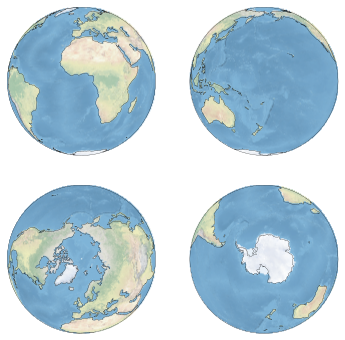

In [35]:

#resolution='10m' 
#resolution='50m'
resolution='110m'
fig = plt.figure(figsize=(6,6))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Orthographic(central_longitude=180.0, central_latitude=0.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Orthographic(central_longitude=0.0, central_latitude=-90.0))
ax.stock_img()
ax.set_global()
ax.coastlines(color='black', resolution=resolution)


In [59]:
# map figure
projection = ccrs.PlateCarree()
#projection = ccrs.Orthographic(central_longitude=0.0, central_latitude=0.0)
resolution='10m'
#resolution='50m'
#resolution='110m'
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1, 1, 1, projection=projection)



# borders
#ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=.25)
# if you want border resolution other than 110m you need to use NaturalEarthFeature:
ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'admin_0_countries', edgecolor='black',
                                                   facecolor='none',
                                                   linewidth=.25,
                                                   scale=resolution))

ax.add_feature(cartopy.feature.NaturalEarthFeature('cultural', 'populated_places', color='red', edgecolor='red',
                                                   facecolor='red', scale=resolution), zorder=4)

# frame of map
ax.outline_patch.set_edgecolor('grey')

# coastline
ax.coastlines(color='black', resolution=resolution)

# set visible part of the world (default is plotted part)
#ax.set_global()
ax.set_extent([80, 170, -45, 30])
#ax.set_extent([-20, 40, 30, 70])